In [7]:



import pandas as pd
import numpy as np





In [8]:
real=pd.read_csv('True.csv')

fake=pd.read_csv("Fake.csv")


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

E:\Anaconda\envs\tf\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


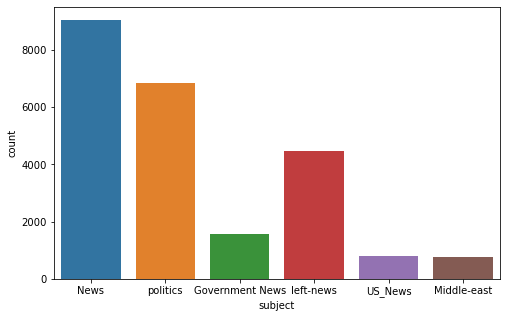

In [10]:
plt.figure(figsize=(8,5))
sns.countplot("subject", data=fake)
plt.show()

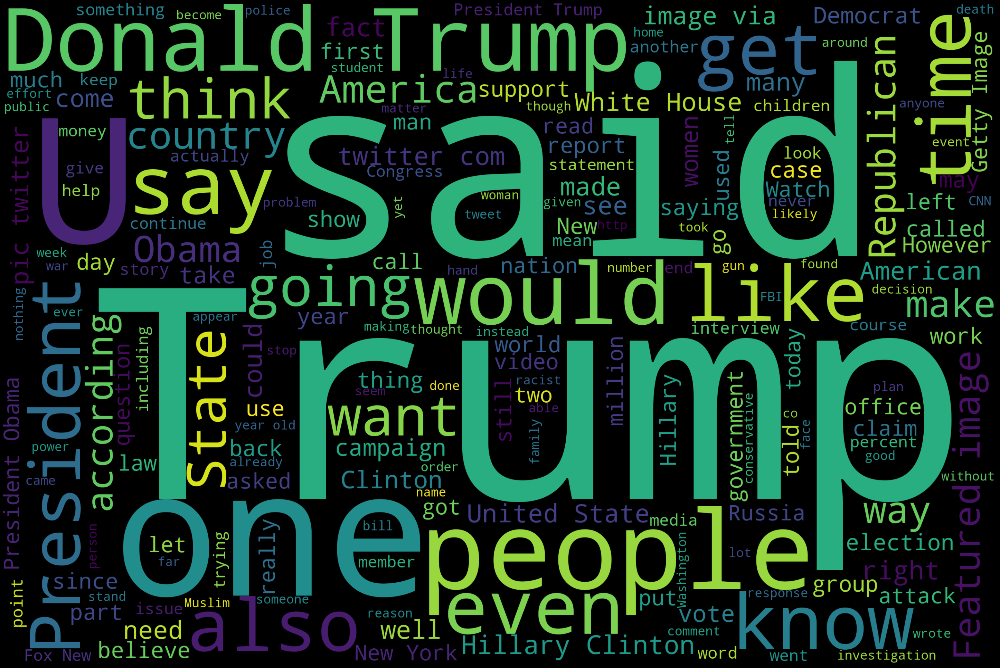

In [12]:
#Word Cloud
text = ''
for news in fake.text.values:
    text += f" {news}"
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
del text

In [13]:
real["class"] = 1
fake["class"] = 0

In [14]:

real["text"] = real["title"] + " " + real["text"]
fake["text"] = fake["title"] + " " + fake["text"]

In [15]:
real = real.drop(["subject", "date","title"], axis=1)
fake = fake.drop(["subject", "date", "title"], axis=1)

In [16]:
data = real.append(fake, ignore_index=True)

In [17]:
del real, fake

In [18]:
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\venka\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\venka\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [19]:
data

,text,class
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1
...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,0
44896,How to Blow $700 Million: Al Jazeera America F...,0


In [20]:
data.head()

,text,class
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1


In [21]:
data.tail()

,text,class
44893,McPain: John McCain Furious That Iran Treated ...,0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,0
44896,How to Blow $700 Million: Al Jazeera America F...,0
44897,10 U.S. Navy Sailors Held by Iranian Military ...,0


In [22]:
data.info

<bound method DataFrame.info of                                                     text  class
0      As U.S. budget fight looms, Republicans flip t...      1
1      U.S. military to accept transgender recruits o...      1
2      Senior U.S. Republican senator: 'Let Mr. Muell...      1
3      FBI Russia probe helped by Australian diplomat...      1
4      Trump wants Postal Service to charge 'much mor...      1
...                                                  ...    ...
44893  McPain: John McCain Furious That Iran Treated ...      0
44894  JUSTICE? Yahoo Settles E-mail Privacy Class-ac...      0
44895  Sunnistan: US and Allied ‘Safe Zone’ Plan to T...      0
44896  How to Blow $700 Million: Al Jazeera America F...      0
44897  10 U.S. Navy Sailors Held by Iranian Military ...      0

[44898 rows x 2 columns]>

E:\Anaconda\envs\tf\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='class', ylabel='count'>

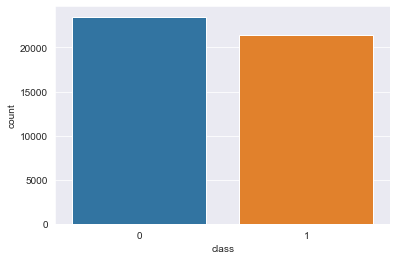

In [23]:
import seaborn as sns

sns.set_style("darkgrid")
sns.countplot(data['class'])

DATA Preprocessing

In [26]:
import preprocess_vendroid as ven

In [27]:
%config Completer.use_jedi = False

In [47]:
y = data["class"].values
#Converting X to format acceptable by gensim, removing annd punctuation stopwords in the process
X = []
stop_words = set(nltk.corpus.stopwords.words("english"))
tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
for par in data["text"].values:
    tmp = []
    sentences = nltk.sent_tokenize(par)
    for sent in sentences:
        sent = sent.lower()
        tokens = tokenizer.tokenize(sent)
        filtered_words = [w.strip() for w in tokens if w not in stop_words and len(w) > 1]
        tmp.extend(filtered_words)
    X.append(tmp)

# del data

In [48]:
X

[['budget',
  'fight',
  'looms',
  'republicans',
  'flip',
  'fiscal',
  'script',
  'washington',
  'reuters',
  'head',
  'conservative',
  'republican',
  'faction',
  'congress',
  'voted',
  'month',
  'huge',
  'expansion',
  'national',
  'debt',
  'pay',
  'tax',
  'cuts',
  'called',
  'fiscal',
  'conservative',
  'sunday',
  'urged',
  'budget',
  'restraint',
  '2018',
  'keeping',
  'sharp',
  'pivot',
  'way',
  'among',
  'republicans',
  'representative',
  'mark',
  'meadows',
  'speaking',
  'cbs',
  'face',
  'nation',
  'drew',
  'hard',
  'line',
  'federal',
  'spending',
  'lawmakers',
  'bracing',
  'battle',
  'january',
  'return',
  'holidays',
  'wednesday',
  'lawmakers',
  'begin',
  'trying',
  'pass',
  'federal',
  'budget',
  'fight',
  'likely',
  'linked',
  'issues',
  'immigration',
  'policy',
  'even',
  'november',
  'congressional',
  'election',
  'campaigns',
  'approach',
  'republicans',
  'seek',
  'keep',
  'control',
  'congress',
  'p

In [43]:
len(data['text'][0])

4724

In [28]:
df=data.copy()

Using my preprocessing library to remove Stopwords and special characters

In [29]:
df['text']=df['text'].apply(lambda x: ven.remove_stopwords(x.lower()) )

In [30]:
df['text']=df['text'].apply(lambda x: ven.remove_special_chars(x))

In [31]:
df['text']=df['text'].str.replace(r'\b\w\b','').str.replace(r'\s+', ' ')

E:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [38]:
df.text.values

array(['us budget fight looms republicans flip fiscal script washington reuters head conservative republican faction us congress voted month huge expansion national debt pay tax cuts called fiscal conservative sunday urged budget restraint 2018 keeping sharp pivot way republicans us representative mark meadows speaking cbs face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy november congressional election campaigns approach republicans seek control congress president donald trump republicans want big budget increase military spending democrats want proportional increases nondefense discretionary spending programs support education scientific research infrastructure public health environmental protection the trump administration willing say were going increase nondefense discretionary spending percent meadows chairman small influential house freedom

All the single character words have been removed

In [37]:
[i for i in df.text.values if len(i.strip())<1]

[]

In [40]:
df['tt']=df['text'].apply(lambda row: nltk.word_tokenize(row))

In [49]:
df['tt']

0        [us, budget, fight, looms, republicans, flip, ...
1        [us, military, accept, transgender, recruits, ...
2        [senior, us, republican, senator, let, mr, mue...
3        [fbi, russia, probe, helped, australian, diplo...
4        [trump, wants, postal, service, charge, much, ...
                               ...                        
44893    [mcpain, john, mccain, furious, iran, treated,...
44894    [justice, yahoo, settles, email, privacy, clas...
44895    [sunnistan, allied, safe, zone, plan, territor...
44896    [blow, 700, million, al, jazeera, america, fin...
44897    [10, us, navy, sailors, held, iranian, militar...
Name: tt, Length: 44898, dtype: object

In [50]:
x=df['tt'].values

In [51]:
x.tolist()

[['us',
  'budget',
  'fight',
  'looms',
  'republicans',
  'flip',
  'fiscal',
  'script',
  'washington',
  'reuters',
  'head',
  'conservative',
  'republican',
  'faction',
  'us',
  'congress',
  'voted',
  'month',
  'huge',
  'expansion',
  'national',
  'debt',
  'pay',
  'tax',
  'cuts',
  'called',
  'fiscal',
  'conservative',
  'sunday',
  'urged',
  'budget',
  'restraint',
  '2018',
  'keeping',
  'sharp',
  'pivot',
  'way',
  'republicans',
  'us',
  'representative',
  'mark',
  'meadows',
  'speaking',
  'cbs',
  'face',
  'nation',
  'drew',
  'hard',
  'line',
  'federal',
  'spending',
  'lawmakers',
  'bracing',
  'battle',
  'january',
  'return',
  'holidays',
  'wednesday',
  'lawmakers',
  'begin',
  'trying',
  'pass',
  'federal',
  'budget',
  'fight',
  'likely',
  'linked',
  'issues',
  'immigration',
  'policy',
  'november',
  'congressional',
  'election',
  'campaigns',
  'approach',
  'republicans',
  'seek',
  'control',
  'congress',
  'presiden

In [54]:
len(x[0])

443

In [55]:
y = data["class"].values

In [56]:
y

array([1, 1, 1, ..., 0, 0, 0], dtype=int64)

# Word Embedding using Gensim Word2vec model

In [57]:
import gensim

In [58]:
emb_dim = 100


w2v_model = gensim.models.Word2Vec(sentences=x, size=emb_dim, window=5, min_count=1)

In [59]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

 Tokenizing The sentences With Tokenizer

In [60]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(x)

X = tokenizer.texts_to_sequences(x)

In [171]:
nos = np.array([len(i) for i in X])
len(nos[nos  < 700])

44130

In [172]:
nos

array([ 446,  374,  257, ..., 2240,  261,  516])

Majority sentences under 700 words

In [62]:
maxlen = 700 
X = pad_sequences(X, maxlen=maxlen)

In [63]:

vocab_size = len(tokenizer.word_index) + 1

In [211]:
X[1]

array([     0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
      

Getting Weight matrix  for our vocabulary.This will be used by the embedding layers of tf

In [66]:
def get_weight(model, vocab):
    
    vocab_size = len(vocab) + 1
   
    weight_matrix = np.zeros((vocab_size, emb_dim))
    
    for word, i in vocab.items():
        weight_matrix[i] = model[word]
        
        
    return weight_matrix

In [67]:
word_index = tokenizer.word_index
emb_vec = get_weight(w2v_model, word_index)

E:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


In [68]:
word_index.items()

dict_items([('said', 1), ('trump', 2), ('us', 3), ('president', 4), ('people', 5), ('new', 6), ('state', 7), ('house', 8), ('reuters', 9), ('donald', 10), ('states', 11), ('clinton', 12), ('obama', 13), ('government', 14), ('republican', 15), ('white', 16), ('united', 17), ('told', 18), ('like', 19), ('campaign', 20), ('news', 21), ('election', 22), ('time', 23), ('party', 24), ('hillary', 25), ('washington', 26), ('year', 27), ('country', 28), ('video', 29), ('years', 30), ('media', 31), ('security', 32), ('political', 33), ('national', 34), ('police', 35), ('law', 36), ('court', 37), ('american', 38), ('republicans', 39), ('going', 40), ('percent', 41), ('trumps', 42), ('bill', 43), ('presidential', 44), ('says', 45), ('russia', 46), ('north', 47), ('senate', 48), ('support', 49), ('democratic', 50), ('administration', 51), ('vote', 52), ('america', 53), ('it', 54), ('week', 55), ('including', 56), ('group', 57), ('know', 58), ('officials', 59), ('think', 60), ('according', 61), ('wa

In [203]:
emb_vec[5]

array([ 1.95648897,  0.94945002, -0.2558493 ,  4.10951567, -0.43701741,
        0.77184427,  1.22853017, -2.05702591, -1.59868991,  0.27657709,
       -0.13594645,  1.44819129,  0.18733256, -1.98455787,  0.05282388,
        0.50373167, -0.52808321,  0.92946053, -0.67537749,  1.17217672,
        0.0841781 , -2.52176738, -1.34565616, -3.52392888,  2.94116879,
       -0.05278124,  0.65824986, -0.53733331, -0.88923883, -0.29689673,
       -1.09060454,  0.86083496,  0.39837924, -1.61269057,  0.34906831,
       -1.4339695 ,  0.50297827,  0.30245382, -1.91889584, -0.44387138,
        1.60566795, -0.38398311, -1.86606002,  1.37054551,  2.4534235 ,
        3.33030462, -1.8621875 ,  2.07131743, -0.93860626,  0.87983966,
       -0.91522294, -1.10855746,  0.66658974,  0.61645579,  1.87557423,
       -0.61587083, -0.35963383, -2.43195081,  1.60680771, -0.0215352 ,
        0.42510092, -3.59175682, -0.00783873,  1.15697539,  2.05093265,
        0.51732332, -1.84115434, -2.13021278, -1.98561311,  2.45

In [180]:
emb_vec.shape

(231443, 100)

# Creating And training Model

In [83]:
model = Sequential()
#Non-trainable embeddidng layer
model.add(Embedding(vocab_size, output_dim=emb_dim, weights=[emb_vec], input_length=maxlen, trainable=False))

model.add(LSTM(units=64 , return_sequences = True , recurrent_dropout = 0.25 , dropout = 0.25))
model.add(LSTM(units=16 , recurrent_dropout = 0.1 , dropout = 0.1))
model.add(Dense(units = 32 , activation = 'relu'))
model.add(Dense(1, activation='sigmoid'))


In [89]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

# del embedding_vectors

In [95]:
model = Sequential()
#Non-trainable embeddidng layer
model.add(Embedding(vocab_size, output_dim=emb_dim, weights=[emb_vec], input_length=maxlen, trainable=False))
#LSTM 
model.add(LSTM(units=128))
model.add(Dense(units = 32 , activation = 'relu'))
model.add(Dense(1, activation='sigmoid'))


In [96]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [97]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 700, 100)          23140600  
_________________________________________________________________
lstm_6 (LSTM)                (None, 128)               117248    
_________________________________________________________________
dense_6 (Dense)              (None, 32)                4128      
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 33        
Total params: 23,262,009
Trainable params: 121,409
Non-trainable params: 23,140,600
_________________________________________________________________


In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0, stratify = y)

In [99]:
X_test,X_val,y_test,y_val = train_test_split(X_test, y_test, test_size = 0.3, random_state = 0, stratify = y_test)

In [250]:
X_train.shape

(31428, 700)

In [251]:
X_val.shape

(4041, 700)

In [252]:
X_test.shape

(9429, 700)

In [100]:
history=model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs=6)

Train on 31428 samples, validate on 4041 samples
Epoch 1/6
31428/31428 [==============================] - 55s 2ms/sample - loss: 0.0789 - acc: 0.9730 - val_loss: 0.0203 - val_acc: 0.9955
Epoch 2/6
31428/31428 [==============================] - 52s 2ms/sample - loss: 0.0417 - acc: 0.9874 - val_loss: 0.0240 - val_acc: 0.9946
Epoch 3/6
31428/31428 [==============================] - 52s 2ms/sample - loss: 0.0212 - acc: 0.9942 - val_loss: 0.0112 - val_acc: 0.9980
Epoch 4/6
31428/31428 [==============================] - 52s 2ms/sample - loss: 0.0139 - acc: 0.9959 - val_loss: 0.0112 - val_acc: 0.9975
Epoch 5/6
31428/31428 [==============================] - 52s 2ms/sample - loss: 0.0066 - acc: 0.9983 - val_loss: 0.0150 - val_acc: 0.9968
Epoch 6/6
31428/31428 [==============================] - 52s 2ms/sample - loss: 0.0091 - acc: 0.9971 - val_loss: 0.0104 - val_acc: 0.9975


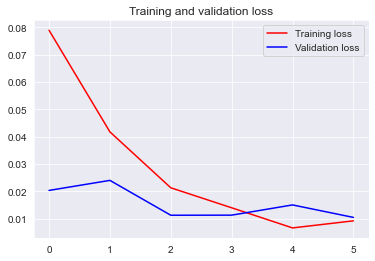

<Figure size 432x288 with 0 Axes>

In [244]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()


plt.show()

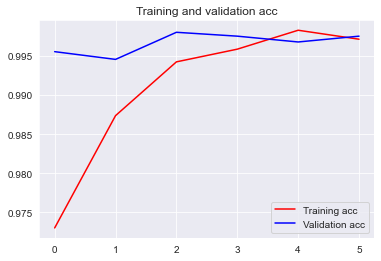

<Figure size 432x288 with 0 Axes>

In [245]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation acc')
plt.legend(loc=0)
plt.figure()


plt.show()

In [101]:
model.evaluate(X_test,y_test)

9429/9429 [==============================] - 7s 705us/sample - loss: 0.0146 - acc: 0.9963


[0.0146426604722402, 0.99628806]

In [217]:
x='Donald Trump wins the US presidential elections'  

In [218]:
x.lower()

'donald trump wins the us presidential elections'

In [224]:
x=df['text'][40000]

In [228]:
df['class'][40000]

0

In [219]:
def clean(x):
    x=x.lower()
    x=ven.remove_stopwords(x)
    x=ven.remove_special_chars(x)
    x=x.replace(r'\b\w\b','').replace(r'\s+', ' ')
    return x

In [220]:
def get_encoded(x):
    x = clean(x)
    x = tokenizer.texts_to_sequences([x])
    x = pad_sequences(x, maxlen=maxlen)
    return x

0-Fake news,
1-REal News

In [198]:
# model.predict(x)

In [166]:
import tensorflow as tf

In [225]:
m=tf.keras.models.load_model('fakenewsmodel')

In [226]:
m.predict(get_encoded(x))

array([[5.9173377e-05]], dtype=float32)

In [165]:
model.save('fakenewsmodel',save_format='h5')

In [255]:
type(get_encoded(x))

numpy.ndarray

In [169]:
y_pred = (model.predict(X_test) > 0.5).astype("int")

In [170]:
accuracy_score(y_test, y_pred)

0.9962880475129918

In [171]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      4931
           1       1.00      0.99      1.00      4498

    accuracy                           1.00      9429
   macro avg       1.00      1.00      1.00      9429
weighted avg       1.00      1.00      1.00      9429



In [248]:
y_pred = (model.predict(X_test) > 0.5).astype("int")

In [265]:
accuracy_score(y_test, y_pred)

0.9962880475129918